In [3]:
import urllib
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pylab as plt
%matplotlib inline
from pandas import Series
from pandas import DataFrame
from pandas.tools.plotting import scatter_matrix
from pylab import rcParams
import scipy as sp
import seaborn as sns
import xgboost as xgb


from scipy.stats.stats import pearsonr
from scipy.stats import spearmanr
from scipy.stats import chi2_contingency
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.cluster.hierarchy import fcluster
from scipy.cluster.hierarchy import cophenet
from scipy.spatial.distance import pdist

import sklearn
from sklearn import preprocessing
from sklearn import decomposition
from sklearn.preprocessing import scale
from sklearn.decomposition import FactorAnalysis
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler

from sklearn.cluster import DBSCAN
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from mpl_toolkits.mplot3d import Axes3D
import sklearn.metrics as sm
from sklearn.metrics import confusion_matrix,classification_report
from sklearn.metrics import accuracy_score

from sklearn.neighbors import KNeighborsClassifier
from sklearn import neighbors
#from sklearn.cross_validation import train_test_split
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression

from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import BernoulliNB

from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier


from collections import Counter
from sklearn import datasets

from IPython.display import Image
from IPython.core.display import HTML


In [4]:
#read in train data
train=pd.read_csv('train.csv')
train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [5]:
#read in test data
test=pd.read_csv("test.csv")
test.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,...,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,...,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


In [4]:
train.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [6]:
### Data fields
Here's a brief version of what you'll find in the data description file.

SalePrice - the property's sale price in dollars. This is the target variable that you're trying to predict.
MSSubClass: The building class
MSZoning: The general zoning classification
LotFrontage: Linear feet of street connected to property
LotArea: Lot size in square feet
Street: Type of road access
Alley: Type of alley access
LotShape: General shape of property
LandContour: Flatness of the property
Utilities: Type of utilities available
LotConfig: Lot configuration
LandSlope: Slope of property
Neighborhood: Physical locations within Ames city limits
Condition1: Proximity to main road or railroad
Condition2: Proximity to main road or railroad (if a second is present)
BldgType: Type of dwelling
HouseStyle: Style of dwelling
OverallQual: Overall material and finish quality
OverallCond: Overall condition rating
YearBuilt: Original construction date
YearRemodAdd: Remodel date
RoofStyle: Type of roof
RoofMatl: Roof material
Exterior1st: Exterior covering on house
Exterior2nd: Exterior covering on house (if more than one material)
MasVnrType: Masonry veneer type
MasVnrArea: Masonry veneer area in square feet
ExterQual: Exterior material quality
ExterCond: Present condition of the material on the exterior
Foundation: Type of foundation
BsmtQual: Height of the basement
BsmtCond: General condition of the basement
BsmtExposure: Walkout or garden level basement walls
BsmtFinType1: Quality of basement finished area
BsmtFinSF1: Type 1 finished square feet
BsmtFinType2: Quality of second finished area (if present)
BsmtFinSF2: Type 2 finished square feet
BsmtUnfSF: Unfinished square feet of basement area
TotalBsmtSF: Total square feet of basement area
Heating: Type of heating
HeatingQC: Heating quality and condition
CentralAir: Central air conditioning
Electrical: Electrical system
1stFlrSF: First Floor square feet
2ndFlrSF: Second floor square feet
LowQualFinSF: Low quality finished square feet (all floors)
GrLivArea: Above grade (ground) living area square feet
BsmtFullBath: Basement full bathrooms
BsmtHalfBath: Basement half bathrooms
FullBath: Full bathrooms above grade
HalfBath: Half baths above grade
Bedroom: Number of bedrooms above basement level
Kitchen: Number of kitchens
KitchenQual: Kitchen quality
TotRmsAbvGrd: Total rooms above grade (does not include bathrooms)
Functional: Home functionality rating
Fireplaces: Number of fireplaces
FireplaceQu: Fireplace quality
GarageType: Garage location
GarageYrBlt: Year garage was built
GarageFinish: Interior finish of the garage
GarageCars: Size of garage in car capacity
GarageArea: Size of garage in square feet
GarageQual: Garage quality
GarageCond: Garage condition
PavedDrive: Paved driveway
WoodDeckSF: Wood deck area in square feet
OpenPorchSF: Open porch area in square feet
EnclosedPorch: Enclosed porch area in square feet
3SsnPorch: Three season porch area in square feet
ScreenPorch: Screen porch area in square feet
PoolArea: Pool area in square feet
PoolQC: Pool quality
Fence: Fence quality
MiscFeature: Miscellaneous feature not covered in other categories
MiscVal: $Value of miscellaneous feature
MoSold: Month Sold
YrSold: Year Sold
SaleType: Type of sale
SaleCondition: Condition of sale

SyntaxError: invalid syntax (<ipython-input-6-3123e5c8855c>, line 2)

In [83]:
train.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating           object


In [ ]:
train.info()

In [ ]:

sns.scatterplot(data=train,y='SalePrice',x='YrSold')

C:\Users\chunter\AppData\Local\Continuum\anaconda3\lib\site-packages\numpy\lib\histograms.py:754: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\Users\chunter\AppData\Local\Continuum\anaconda3\lib\site-packages\numpy\lib\histograms.py:755: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


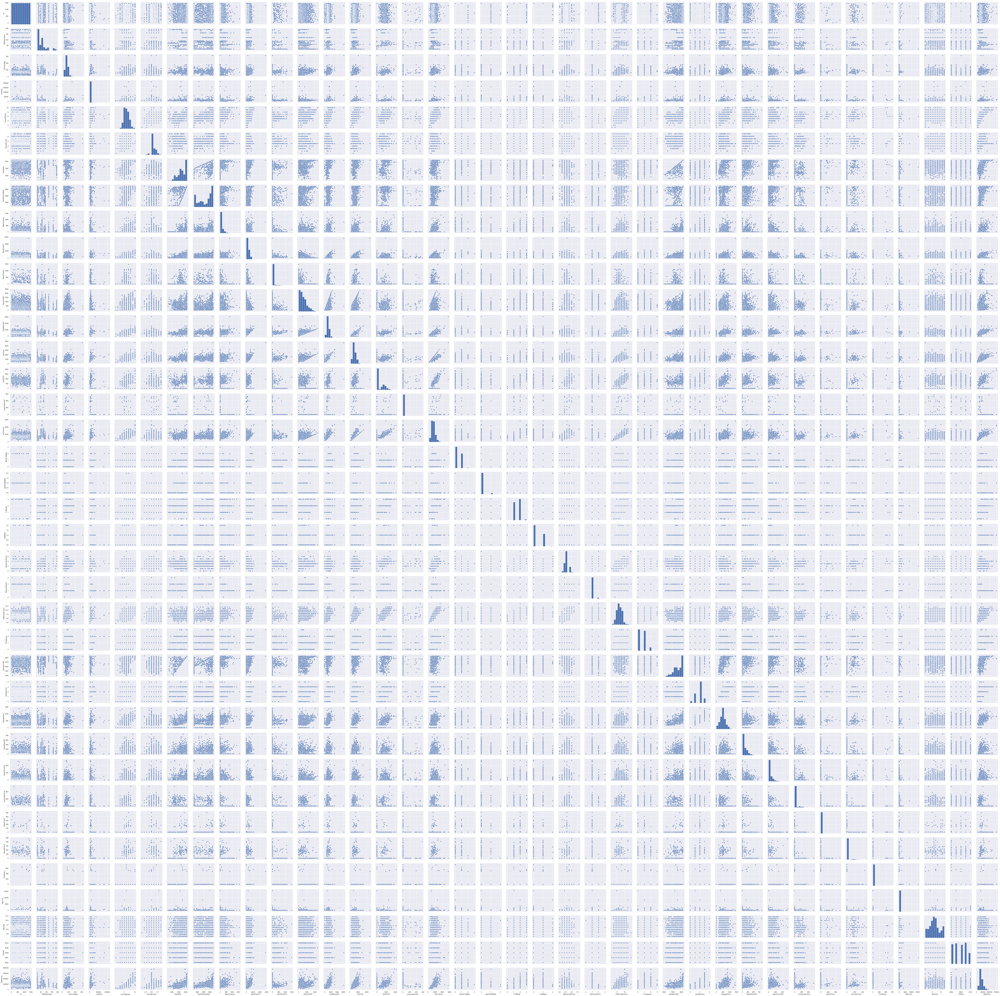

In [37]:
#plotting the relationship of sale price and other variables
sns.pairplot(train)

In [ ]:
#viewing missing data
train.isnull().sum().sort_values(ascending=False).head(10)/len(train)*100

In [ ]:
# view missing data
test.isnull().sum().sort_values(ascending=False).head(10)/len(test)*100

In [ ]:
test['SalePrice']='None'

In [ ]:
train.drop(columns=['Id'],inplace=True)
test.drop(columns=['Id'],inplace=True)

In [166]:
# combine all data
all =train.append(test,ignore_index=True)
all.shape

(2919, 81)

In [8]:
# view missing data
all.isnull().sum().sort_values(ascending=False).head(10)/len(all)*100

PoolQC          99.657417
MiscFeature     96.402878
Alley           93.216855
Fence           80.438506
SalePrice       49.982871
FireplaceQu     48.646797
LotFrontage     16.649538
GarageFinish     5.447071
GarageCond       5.447071
GarageQual       5.447071
dtype: float64

In [167]:
#drop columns where more than 48% of the data is missing
all.drop(columns=['PoolQC','MiscFeature','Alley','Fence','FireplaceQu'],inplace=True)


In [10]:
#check to make sure the columns with over 48% missing values are removed
all.isnull().sum().sort_values(ascending=False).head(10)/len(all)*100

SalePrice       49.982871
LotFrontage     16.649538
GarageQual       5.447071
GarageYrBlt      5.447071
GarageCond       5.447071
GarageFinish     5.447071
GarageType       5.378554
BsmtCond         2.809181
BsmtExposure     2.809181
BsmtQual         2.774923
dtype: float64

In [13]:
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
all.corr('spearman')

,1stFlrSF,2ndFlrSF,3SsnPorch,BedroomAbvGr,BsmtFinSF1,BsmtFinSF2,BsmtFullBath,BsmtHalfBath,BsmtUnfSF,EnclosedPorch,Fireplaces,FullBath,GarageArea,GarageCars,GarageYrBlt,GrLivArea,HalfBath,Id,KitchenAbvGr,LotArea,LotFrontage,LowQualFinSF,MSSubClass,MasVnrArea,MiscVal,MoSold,OpenPorchSF,OverallCond,OverallQual,PoolArea,SalePrice,ScreenPorch,TotRmsAbvGrd,TotalBsmtSF,WoodDeckSF,YearBuilt,YearRemodAdd,YrSold
1stFlrSF,1.000000,-0.325262,0.045745,0.117145,0.333337,0.054144,0.253654,0.009719,0.220145,-0.130858,0.388710,0.369282,0.489581,0.450364,0.264164,0.492163,-0.145680,-0.012859,0.094484,0.441315,0.444356,-0.039526,-0.280339,0.386837,-0.008910,0.044757,0.252030,-0.187512,0.415785,0.078886,0.575408,0.106742,0.344834,0.828805,0.206363,0.324812,0.250486,-0.019222
2ndFlrSF,-0.325262,1.000000,-0.030769,0.500984,-0.200660,-0.116744,-0.181513,-0.065300,0.049207,0.047658,0.160748,0.359323,0.090176,0.153011,0.080446,0.604574,0.619286,-0.020274,0.057619,0.062352,-0.002042,0.030853,0.484969,0.024942,-0.011283,0.013539,0.203599,-0.013782,0.242790,0.023128,0.293598,-0.008285,0.554216,-0.312129,0.067312,0.022781,0.089319,-0.013651
3SsnPorch,0.045745,-0.030769,1.000000,-0.049514,0.060979,0.001059,0.033081,0.048346,-0.014218,-0.026846,0.035194,0.019630,0.018801,0.017224,0.014309,0.015402,-0.024217,-0.044138,-0.023739,0.028611,0.010037,0.012562,-0.032750,0.024885,0.011583,0.035916,0.001158,0.044216,0.019982,-0.007578,0.065440,-0.035081,-0.030848,0.042964,-0.003640,0.011364,0.049236,0.017068
BedroomAbvGr,0.117145,0.500984,-0.049514,1.000000,-0.094735,-0.019462,-0.148456,0.017327,0.162715,0.001384,0.113086,0.316602,0.114783,0.123043,-0.042518,0.525690,0.284231,-0.002889,0.185944,0.293630,0.283391,0.020600,0.066885,0.090339,0.021553,0.051073,0.079066,-0.014184,0.086699,0.025555,0.234907,-0.001873,0.663443,0.058511,0.031803,-0.030463,-0.033566,-0.021356
BsmtFinSF1,0.333337,-0.200660,0.060979,-0.094735,1.000000,0.055353,0.667057,0.092598,-0.547368,-0.145986,0.241007,0.030809,0.248265,0.203078,0.118903,0.073816,-0.024834,-0.019013,-0.113988,0.176311,0.161309,-0.082764,-0.103440,0.272857,0.020720,-0.007018,0.092164,-0.019715,0.175055,0.030258,0.301871,0.093595,-0.039921,0.426810,0.206608,0.214106,0.088088,0.026291
BsmtFinSF2,0.054144,-0.116744,0.001059,-0.019462,0.055353,1.000000,0.163432,0.134195,-0.296526,0.028851,0.034586,-0.104511,-0.012619,-0.060531,-0.141270,-0.077038,-0.062923,0.006067,-0.046538,0.060635,0.047170,-0.015340,-0.097622,-0.028485,0.036472,-0.011922,-0.058187,0.097081,-0.096030,0.055235,-0.038806,0.059711,-0.083976,0.062634,0.060260,-0.096544,-0.117366,0.024918
BsmtFullBath,0.253654,-0.181513,0.033081,-0.148456,0.667057,0.163432,1.000000,-0.154387,-0.418255,-0.091591,0.155478,-0.024794,0.196314,0.161620,0.130321,0.031776,-0.047778,-0.001503,-0.050810,0.111382,0.108838,-0.057773,-0.044860,0.161911,-0.000474,-0.002055,0.094164,-0.044549,0.144920,0.044730,0.225125,0.059092,-0.058045,0.321377,0.175778,0.187253,0.121089,0.041887
BsmtHalfBath,0.009719,-0.065300,0.048346,0.017327,0.092598,0.134195,-0.154387,1.000000,-0.104707,-0.017372,0.034409,-0.047100,-0.025313,-0.040504,-0.081824,-0.065645,-0.068160,0.008666,-0.052846,0.008082,-0.030946,-0.017361,0.006214,0.032628,0.060636,0.024190,-0.050853,0.088844,-0.045989,0.027762,-0.012189,0.049297,-0.060830,0.003236,0.040332,-0.054016,-0.057028,-0.013248
BsmtUnfSF,0.220145,0.049207,-0.014218,0.162715,-0.547368,-0.296526,-0.418255,-0.104707,1.000000,0.034453,0.022562,0.240589,0.106106,0.140332,0.178197,0.246493,-0.009163,-0.014729,0.021597,0.063425,0.088642,0.034555,-0.108284,0.052642,-0.059346,0.024140,0.149284,-0.125167,0.245377,-0.036836,0.185197,-0.048815,0.246413,0.332264,-0.046149,0.125628,0.166890,-0.038392
EnclosedPorch,-0.130858,0.047658,-0.026846,0.001384,-0.145986,0.028851,-0.091591,-0.017372,0.034453,1.000000,-0.043052,-0.180006,-0.180477,-0.204806,-0.349967,-0.058087,-0.124968,0.035036,0.031932,-0.044906,-0.094946,0.046131,-0.002817,-0.189333,0.027421,-0.015574,-0.181744,0.134346,-0.1907

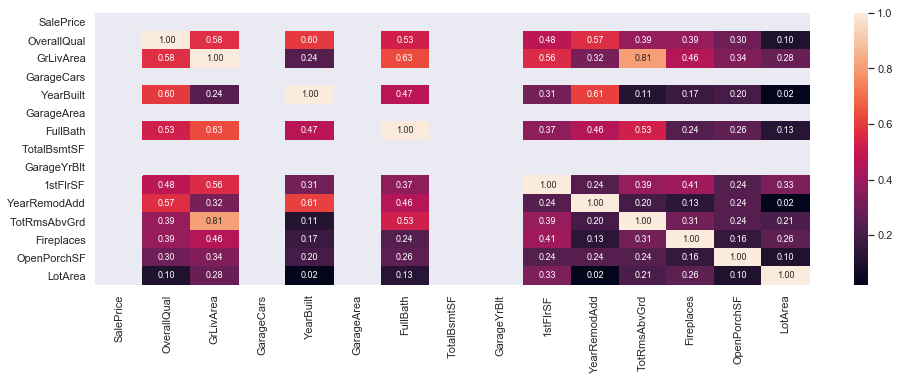

In [28]:
#saleprice correlation matrix
k = 15 #number of variables for heatmap
plt.figure(figsize=(16,5))
cols = all.corr('spearman').nlargest(k, 'SalePrice')['SalePrice'].index
cm = np.corrcoef(all[cols].values.T)
sns.set(font_scale=1.)
hm = sns.heatmap(cm, cbar=True, annot=True, square=False, fmt='.2f', annot_kws={'size': 9}, yticklabels=cols.values, xticklabels=cols.values)
plt.show()

In [27]:
#lets look at the variables with the highest correlation to saleprice
all.corr('spearman').nlargest(k, 'SalePrice')['SalePrice']

SalePrice       1.000000
OverallQual     0.809829
GrLivArea       0.731310
GarageCars      0.690711
YearBuilt       0.652682
GarageArea      0.649379
FullBath        0.635957
TotalBsmtSF     0.602725
GarageYrBlt     0.593788
1stFlrSF        0.575408
YearRemodAdd    0.571159
TotRmsAbvGrd    0.532586
Fireplaces      0.519247
OpenPorchSF     0.477561
LotArea         0.456461
Name: SalePrice, dtype: float64

In [29]:
#lets make sure the variables with highest correlation to saleprice are store in the variable cols
cols

Index(['SalePrice', 'OverallQual', 'GrLivArea', 'GarageCars', 'YearBuilt',
       'GarageArea', 'FullBath', 'TotalBsmtSF', 'GarageYrBlt', '1stFlrSF',
       'YearRemodAdd', 'TotRmsAbvGrd', 'Fireplaces', 'OpenPorchSF', 'LotArea'],
      dtype='object')

In [58]:
#Lets look at the number of missing values for the variables with the highest correlation to SalePrice
all[cols].isnull().sum()

SalePrice       1459
OverallQual        0
GrLivArea          0
GarageCars         1
YearBuilt          0
GarageArea         1
FullBath           0
TotalBsmtSF        1
GarageYrBlt      159
1stFlrSF           0
YearRemodAdd       0
TotRmsAbvGrd       0
Fireplaces         0
OpenPorchSF        0
LotArea            0
dtype: int64

In [170]:
#lets inspect the relationship between year build and GarageYrBlt
all[all['YearBuilt']!=all['GarageYrBlt']].head()

# the result is that they are not the same

,1stFlrSF,2ndFlrSF,3SsnPorch,BedroomAbvGr,BldgType,BsmtCond,BsmtExposure,BsmtFinSF1,BsmtFinSF2,BsmtFinType1,BsmtFinType2,BsmtFullBath,BsmtHalfBath,BsmtQual,BsmtUnfSF,CentralAir,Condition1,Condition2,Electrical,EnclosedPorch,ExterCond,ExterQual,Exterior1st,Exterior2nd,Fireplaces,Foundation,FullBath,Functional,GarageArea,GarageCars,GarageCond,GarageFinish,GarageQual,GarageType,GarageYrBlt,GrLivArea,HalfBath,Heating,HeatingQC,HouseStyle,Id,KitchenAbvGr,KitchenQual,LandContour,LandSlope,LotArea,LotConfig,LotFrontage,LotShape,LowQualFinSF,MSSubClass,MSZoning,MasVnrArea,MasVnrType,MiscVal,MoSold,Neighborhood,OpenPorchSF,OverallCond,OverallQual,PavedDrive,PoolArea,RoofMatl,RoofStyle,SaleCondition,SalePrice,SaleType,ScreenPorch,Street,TotRmsAbvGrd,TotalBsmtSF,Utilities,WoodDeckSF,YearBuilt,YearRemodAdd,YrSold


In [77]:
q= all[all.GarageYrBlt.isnull()]
q.sort_values(by='YearBuilt',ascending =True)

,1stFlrSF,2ndFlrSF,3SsnPorch,Alley,BedroomAbvGr,BldgType,BsmtCond,BsmtExposure,BsmtFinSF1,BsmtFinSF2,BsmtFinType1,BsmtFinType2,BsmtFullBath,BsmtHalfBath,BsmtQual,BsmtUnfSF,CentralAir,Condition1,Condition2,Electrical,EnclosedPorch,ExterCond,ExterQual,Exterior1st,Exterior2nd,Fence,FireplaceQu,Fireplaces,Foundation,FullBath,Functional,GarageArea,GarageCars,GarageCond,GarageFinish,GarageQual,GarageType,GarageYrBlt,GrLivArea,HalfBath,Heating,HeatingQC,HouseStyle,Id,KitchenAbvGr,KitchenQual,LandContour,LandSlope,LotArea,LotConfig,LotFrontage,LotShape,LowQualFinSF,MSSubClass,MSZoning,MasVnrArea,MasVnrType,MiscFeature,MiscVal,MoSold,Neighborhood,OpenPorchSF,OverallCond,OverallQual,PavedDrive,PoolArea,PoolQC,RoofMatl,RoofStyle,SaleCondition,SalePrice,SaleType,ScreenPorch,Street,TotRmsAbvGrd,TotalBsmtSF,Utilities,WoodDeckSF,YearBuilt,YearRemodAdd,YrSold
1349,938,1215,0,Pave,4,1Fam,Fa,No,259.0,0.0,LwQ,Unf,0.0,0.0,TA,425.0,N,Norm,Norm,SBrkr,20,Gd,TA,MetalSd,MetalSd,NaN,NaN,0,BrkTil,2,Typ,0.0,0.0,NaN,NaN,NaN,NaN,NaN,2358,0,OthW,Fa,2Story,1350,1,TA,Lvl,Gtl,5250,Inside,50.0,Reg,205,70,RM,0.0,None,NaN,0,12,OldTown,54,5,8,Y,0,NaN,CompShg,Gable,Normal,122000.0,WD,0,Pave,8,684.0,AllPub,0,1872,1987,2008
1137,780,240,0,NaN,2,1Fam,TA,No,0.0,0.0,Unf,Unf,0.0,0.0,TA,780.0,N,Feedr,Norm,SBrkr,176,Gd,TA,VinylSd,VinylSd,NaN,NaN,0,CBlock,1,Typ,0.0,0.0,NaN,NaN,NaN,NaN,NaN,1020,0,GasA,Gd,1.5Fin,1138,1,TA,Lvl,Gtl,6342,Inside,54.0,Reg,0,50,RL,0.0,None,NaN,0,5,Sawyer,0,8,5,N,0,NaN,CompShg,Gable,Normal,94000.0,WD,0,Pave,6,780.0,AllPub,0,1875,1996,2010
636,684,396,0,Grvl,3,1Fam,TA,No,0.0,0.0,Unf,Unf,0.0,0.0,Fa,684.0,Y,Norm,Norm,SBrkr,30,TA,TA,Wd Sdng,HdBoard,NaN,NaN,0,BrkTil,1,Typ,0.0,0.0,NaN,NaN,NaN,NaN,NaN,1080,0,GasA,Gd,1.5Fin,2097,1,Gd,Lvl,Gtl,5914,Inside,44.0,Reg,0,50,RM,0.0,None,NaN,0,9,OldTown,165,9,5,N,0,NaN,CompShg,Gable,Normal,NaN,WD,0,Pave,5,684.0,AllPub,0,1890,1996,2008
962,1000,544,0,NaN,3,1Fam,TA,No,0.0,0.0,Unf,Unf,0.0,0.0,Fa,925.0,Y,Artery,Norm,SBrkr,0,Gd,Gd,VinylSd,VinylSd,NaN,NaN,0,CBlock,2,Typ,0.0,0.0,NaN,NaN,NaN,NaN,NaN,1544,0,GasA,Gd,1.5Fin,2423,1,TA,Lvl,Gtl,14190,Inside,60.0,Reg,0,50,RL,0.0,None,NaN,0,4,OldTown,0,7,4,N,0,NaN,CompShg,Gable,Normal,NaN,WD,0,Pave,7,925.0,AllPub,231,1890,2006,2007
1119,1034,957,0,NaN,4,2fmCon,TA,No,0.0,0.0,Unf,Unf,0.0,0.0,TA,957.0,N,Feedr,Norm,SBrkr,133,Gd,TA,VinylSd,VinylSd,NaN,NaN,0,CBlock,2,Typ,0.0,0.0,NaN,NaN,NaN,NaN,NaN,1991,0,GasA,Fa,2Story,2580,2,TA,Lvl,Gtl,8250,Inside,75.0,Reg,0,190,C (all),0.0,None,NaN,0,6,IDOTRR,0,6,5,N,0,NaN,CompShg,Gable,Normal,NaN,WD,0,Pave,9,957.0,AllPub,0,1895,2006,2007
966,751,783,0,Grvl,3,1Fam,TA,Av,0.0,0.0,Unf,Unf,0.0,0.0,Gd,736.0,Y,Norm,Norm,SBrkr,0,Gd,TA,Wd Sdng,HdBoard,NaN,NaN,0,CBlock,1,Typ,0.0,0.0,NaN,NaN,NaN,NaN,NaN,1534,1,GasA,Ex,2Story,2427,1,Gd,Lvl,Gtl,10800,Inside,60.0,Reg,0,70,RL,0.0,None,NaN,0,7,OldTown,112,9,5,N,0,NaN,CompShg,Gable,Normal,NaN,WD,0,Pave,6,736.0,AllPub,0,1895,1999,2007
520,694,600,0,Grvl,3,2fmCon,NaN,NaN,0.0,0.0,NaN,NaN,0.0,0.0,NaN,0.0,N,Norm,Norm,FuseA,210,TA,TA,MetalSd,MetalSd,NaN,NaN,0,BrkTil,2,Typ,0.0,0.0,NaN,NaN,NaN,NaN,NaN,1294,0,GasA,TA,2Story,521,2,TA,Lvl,Gtl,10800,Inside,60.0,Reg,0,190,RL,0.0,None,NaN,0,8,OldTown,114,7,4,N,0,NaN,CompShg,Gable,Normal,106250.0,WD,0,Pave,7,0.0,AllPub,220,1900,2000,2008
921,1272,928,0,NaN,4,Duplex,TA,No,1084.0,0.0,ALQ,Unf,2.0,0.0,TA,188.0,Y,Feedr,Norm,SBrkr,0,TA,TA,MetalSd,MetalSd,GdPrv,NaN,0,CBlock,2,Typ,0.0,0.0,NaN,NaN,NaN,NaN,NaN,2200,2,GasA,Gd,1.5Fin,922,2,TA,Lvl,Gtl,8777,Inside,67.0,Reg,0,90,RL,0.0,None,NaN,0,9,Edwards,70,7,5,N,0,NaN,CompShg,Gable,Normal,145900.0,WD,0,Pave,9,1272.0,AllPub,0,1900,2003,2008
362,797,0,0,NaN,2,1Fam,TA,No,0.0,0.0,Unf,Unf,0.0,0.0,Fa,245.0,N,Norm,Norm,SBrkr,94,Fa,TA,AsbShng,AsbShng,NaN,NaN,0,CBlock,1,Typ,0.0,0.0,NaN,NaN,NaN,NaN,NaN,797,0,GasA,TA,1Story,1823,1,TA,Lvl,Gtl,9392,Corner,72.0,Reg,0,30,C (all),0.0,None,NaN,0,9,IDOTRR,36,3,3,N,0,NaN,CompShg,Mansard,Abnorml,NaN,WD,0,Pave,5,245.0,AllPub,0,1900,1950,2009
374,978,886,0,NaN,6,2fmCon,Fa,No,169.0,0.0,Rec,Unf,0.0,0.0,TA,851.0,N,Fee

In [169]:
all.loc[(all['YearBuilt']>= 1980 & all.GarageYrBlt.isnull()), 'GarageYrBlt'] = all['YearBuilt']


                              

In [165]:
all[all['YearBuilt']<1980]

,1stFlrSF,2ndFlrSF,3SsnPorch,BedroomAbvGr,BldgType,BsmtCond,BsmtExposure,BsmtFinSF1,BsmtFinSF2,BsmtFinType1,BsmtFinType2,BsmtFullBath,BsmtHalfBath,BsmtQual,BsmtUnfSF,CentralAir,Condition1,Condition2,Electrical,EnclosedPorch,ExterCond,ExterQual,Exterior1st,Exterior2nd,Fireplaces,Foundation,FullBath,Functional,GarageArea,GarageCars,GarageCond,GarageFinish,GarageQual,GarageType,GarageYrBlt,GrLivArea,HalfBath,Heating,HeatingQC,HouseStyle,Id,KitchenAbvGr,KitchenQual,LandContour,LandSlope,LotArea,LotConfig,LotFrontage,LotShape,LowQualFinSF,MSSubClass,MSZoning,MasVnrArea,MasVnrType,MiscVal,MoSold,Neighborhood,OpenPorchSF,OverallCond,OverallQual,PavedDrive,PoolArea,RoofMatl,RoofStyle,SaleCondition,SalePrice,SaleType,ScreenPorch,Street,TotRmsAbvGrd,TotalBsmtSF,Utilities,WoodDeckSF,YearBuilt,YearRemodAdd,YrSold
1,1262,0,0,3,1Fam,TA,Gd,978.0,0.0,ALQ,Unf,0.0,1.0,Gd,284.0,Y,Feedr,Norm,SBrkr,0,TA,TA,MetalSd,MetalSd,1,CBlock,2,Typ,460.0,2.0,TA,RFn,TA,Attchd,1976,1262,0,GasA,Ex,1Story,2,1,TA,Lvl,Gtl,9600,FR2,80.0,Reg,0,20,RL,0.0,None,0,5,Veenker,0,8,6,Y,0,CompShg,Gable,Normal,181500.0,WD,0,Pave,6,1262.0,AllPub,298,1976,1976,2007
3,961,756,0,3,1Fam,Gd,No,216.0,0.0,ALQ,Unf,1.0,0.0,TA,540.0,Y,Norm,Norm,SBrkr,272,TA,TA,Wd Sdng,Wd Shng,1,BrkTil,1,Typ,642.0,3.0,TA,Unf,TA,Detchd,1915,1717,0,GasA,Gd,2Story,4,1,Gd,Lvl,Gtl,9550,Corner,60.0,IR1,0,70,RL,0.0,None,0,2,Crawfor,35,5,7,Y,0,CompShg,Gable,Abnorml,140000.0,WD,0,Pave,7,756.0,AllPub,0,1915,1970,2006
7,1107,983,0,3,1Fam,TA,Mn,859.0,32.0,ALQ,BLQ,1.0,0.0,Gd,216.0,Y,PosN,Norm,SBrkr,228,TA,TA,HdBoard,HdBoard,2,CBlock,2,Typ,484.0,2.0,TA,RFn,TA,Attchd,1973,2090,1,GasA,Ex,2Story,8,1,TA,Lvl,Gtl,10382,Corner,NaN,IR1,0,60,RL,240.0,Stone,350,11,NWAmes,204,6,7,Y,0,CompShg,Gable,Normal,200000.0,WD,0,Pave,7,1107.0,AllPub,235,1973,1973,2009
8,1022,752,0,2,1Fam,TA,No,0.0,0.0,Unf,Unf,0.0,0.0,TA,952.0,Y,Artery,Norm,FuseF,205,TA,TA,BrkFace,Wd Shng,2,BrkTil,2,Min1,468.0,2.0,TA,Unf,Fa,Detchd,1931,1774,0,GasA,Gd,1.5Fin,9,2,TA,Lvl,Gtl,6120,Inside,51.0,Reg,0,50,RM,0.0,None,0,4,OldTown,0,5,7,Y,0,CompShg,Gable,Abnorml,129900.0,WD,0,Pave,8,952.0,AllPub,90,1931,1950,2008
9,1077,0,0,2,2fmCon,TA,No,851.0,0.0,GLQ,Unf,1.0,0.0,TA,140.0,Y,Artery,Artery,SBrkr,0,TA,TA,MetalSd,MetalSd,2,BrkTil,1,Typ,205.0,1.0,TA,RFn,Gd,Attchd,1939,1077,0,GasA,Ex,1.5Unf,10,2,TA,Lvl,Gtl,7420,Corner,50.0,Reg,0,190,RL,0.0,None,0,1,BrkSide,4,6,5,Y,0,CompShg,Gable,Normal,118000.0,WD,0,Pave,5,991.0,AllPub,0,1939,1950,2008
10,1040,0,0,3,1Fam,TA,No,906.0,0.0,Rec,Unf,1.0,0.0,TA,134.0,Y,Norm,Norm,SBrkr,0,TA,TA,HdBoard,HdBoard,0,CBlock,1,Typ,384.0,1.0,TA,Unf,TA,Detchd,1965,1040,0,GasA,Ex,1Story,11,1,TA,Lvl,Gtl,11200,Inside,70.0,Reg,0,20,RL,0.0,None,0,2,Sawyer,0,5,5,Y,0,CompShg,Hip,Normal,129500.0,WD,0,Pave,5,1040.0,AllPub,0,1965,1965,2008
12,912,0,0,2,1Fam,TA,No,737.0,0.0,ALQ,Unf,1.0,0.0,TA,175.0,Y,Norm,Norm,SBrkr,0,TA,TA,HdBoard,Plywood,0,CBlock,1,Typ,352.0,1.0,TA,Unf,TA,Detchd,1962,912,0,GasA,TA,1Story,13,1,TA,Lvl,Gtl,12968,Inside,NaN,IR2,0,20,RL,0.0,None,0,9,Sawyer,0,6,5,Y,0,CompShg,Hip,Normal,144000.0,WD,176,Pave,4,912.0,AllPub,140,1962,1962,2008
14,1253,0,0,2,1Fam,TA,No,733.0,0.0,BLQ,Unf,1.0,0.0,TA,520.0,Y,Norm,Norm,SBrkr,176,TA,TA,MetalSd,MetalSd,1,CBlock,1,Typ,352.0,1.0,TA,RFn,TA,Attchd,1960,1253,1,GasA,TA,1Story,15,1,TA,Lvl,Gtl,10920,Corner,NaN,IR1,0,20,RL,212.0,BrkFace,0,5,NAmes,213,5,6,Y,0,CompShg,Hip,Normal,157000.0,WD,0,Pave,5,1253.0,AllPub,0,1960,1960,2008
15,854,0,0,2,1Fam,TA,No,0.0,0.0,Unf,Unf,0.0,0.0,TA,832.0,Y,Norm,Norm,FuseA,0,TA,TA,Wd Sdng,Wd Sdng,0,BrkTil,1,Typ,576.0,2.0,TA,Unf,TA,Detchd,1929,854,0,GasA,Ex,1.5Unf,16,1,TA,Lvl,Gtl,6120,Corner,51.0,Reg,0,45,RM,0.0,None,0,7,BrkSide,112,8,7,Y,0,CompShg,Gable,Normal,132000.0,WD,0,Pave,5,832.0,AllPub,48,1929,2001,2007
16,1004,0,0,2,1Fam,TA,No,578.0,0.0,ALQ,Unf,1.0,0.0,TA,426.0,Y,Norm,Norm,SBrkr,0,TA,TA,Wd Sdng,Wd Sdng,1,CBlock,1,Typ,480.0,2.0,TA,Fin,TA,Attchd,1970,1004,0,GasA,Ex,1Story,17,1,TA,Lvl,Gtl,11241,CulDSac,NaN,IR1,0,20,RL,180.0,BrkFace,700,3,NAmes,0,7,6,Y,0,CompShg,Gable,Normal,149000.0,WD,0

In [161]:
all.GarageYrBlt.isnull().sum()

0

In [172]:
all[cols].isnull().sum()

SalePrice       1459
OverallQual        0
GrLivArea          0
GarageCars         1
YearBuilt          0
GarageArea         1
FullBath           0
TotalBsmtSF        1
GarageYrBlt        0
1stFlrSF           0
YearRemodAdd       0
TotRmsAbvGrd       0
Fireplaces         0
OpenPorchSF        0
LotArea            0
dtype: int64

In [34]:
df_train= train[cols]
df_train.head()

,SalePrice,OverallQual,GrLivArea,GarageCars,YearBuilt,GarageArea,FullBath,TotalBsmtSF,GarageYrBlt,1stFlrSF,YearRemodAdd,TotRmsAbvGrd,Fireplaces,OpenPorchSF,LotArea
0,208500,7,1710,2,2003,548,2,856,2003.0,856,2003,8,0,61,8450
1,181500,6,1262,2,1976,460,2,1262,1976.0,1262,1976,6,1,0,9600
2,223500,7,1786,2,2001,608,2,920,2001.0,920,2002,6,1,42,11250
3,140000,7,1717,3,1915,642,1,756,1998.0,961,1970,7,1,35,9550
4,250000,8,2198,3,2000,836,2,1145,2000.0,1145,2000,9,1,84,14260


In [35]:
# Lets scale the price variable since the ranges are so high
df_train['LogSalePrice']=np.log(df_train['SalePrice'])

C:\Users\chunter\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [36]:
#view the dataset after saleprice has been scaled using the log function
df_train.head()

,SalePrice,OverallQual,GrLivArea,GarageCars,YearBuilt,GarageArea,FullBath,TotalBsmtSF,GarageYrBlt,1stFlrSF,YearRemodAdd,TotRmsAbvGrd,Fireplaces,OpenPorchSF,LotArea,LogSalePrice
0,208500,7,1710,2,2003,548,2,856,2003.0,856,2003,8,0,61,8450,12.247694
1,181500,6,1262,2,1976,460,2,1262,1976.0,1262,1976,6,1,0,9600,12.109011
2,223500,7,1786,2,2001,608,2,920,2001.0,920,2002,6,1,42,11250,12.317167
3,140000,7,1717,3,1915,642,1,756,1998.0,961,1970,7,1,35,9550,11.849398
4,250000,8,2198,3,2000,836,2,1145,2000.0,1145,2000,9,1,84,14260,12.429216


C:\Users\chunter\AppData\Local\Continuum\anaconda3\lib\site-packages\numpy\lib\histograms.py:754: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\Users\chunter\AppData\Local\Continuum\anaconda3\lib\site-packages\numpy\lib\histograms.py:755: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


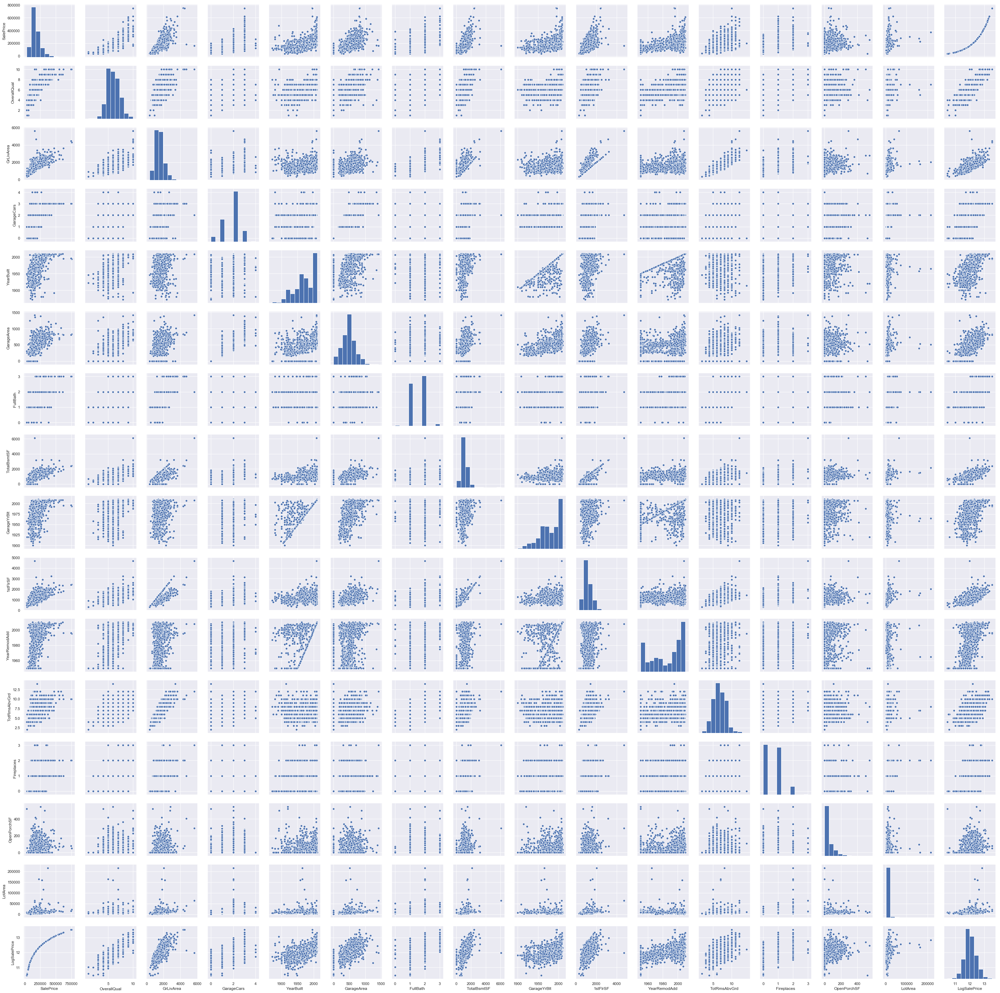

In [38]:
#lets plot the variables to look close at them

sns.pairplot(df_train)

## Linear regression to predict overall score

In [39]:
#assumptions of linear regression
# all variables are continuous and not categorical
# data is free of missing values
# there is a linear relationship between predictors and predictants
# all predictors of independent of each other
# residuals/predictor errors are normally distributed

In [41]:
# all variables are continuous and not categorical
df_train.dtypes

SalePrice         int64
OverallQual       int64
GrLivArea         int64
GarageCars        int64
YearBuilt         int64
GarageArea        int64
FullBath          int64
TotalBsmtSF       int64
GarageYrBlt     float64
1stFlrSF          int64
YearRemodAdd      int64
TotRmsAbvGrd      int64
Fireplaces        int64
OpenPorchSF       int64
LotArea           int64
LogSalePrice    float64
dtype: object

In [40]:
# data is free of missing values
df_train.isnull().sum()/len(df_train)* 100

#GarageYrBlt     5.547945 has 5% of the data missing

SalePrice       0.000000
OverallQual     0.000000
GrLivArea       0.000000
GarageCars      0.000000
YearBuilt       0.000000
GarageArea      0.000000
FullBath        0.000000
TotalBsmtSF     0.000000
GarageYrBlt     5.547945
1stFlrSF        0.000000
YearRemodAdd    0.000000
TotRmsAbvGrd    0.000000
Fireplaces      0.000000
OpenPorchSF     0.000000
LotArea         0.000000
LogSalePrice    0.000000
dtype: float64